## Final Project Week 2 (Lab partner: Percy Nizamova)
### *Summary: For this week, we created a schematic for a triangle wave generator (really a square wave with adjustable frequency, ran into an integrator circuit), then built the circuit. We tweaked the triangle wave until the waveform was decent, slowly changing component values and testing different things. Then, we created a schematic for a Wien bridge oscillator circuit, a circuit that uses electrical noise to produce a sine wave, and built the oscillator itself.*
- Continuing our exploration of wave generation, we decided to first create a schematic for a simple triangle wave generator. Below is the LTspice diagram.
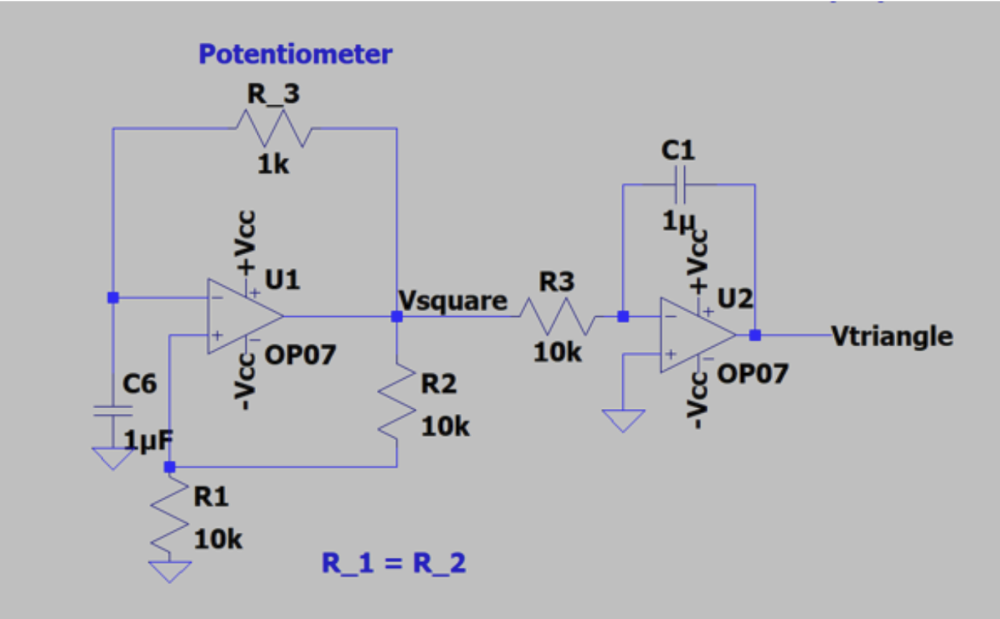
- In this circuit, we have a first portion that creates a square wave using an op-amp, and then the output of this is fed into an integrator op-amp circuit to produce a triangle wave. Below is the simulated behavior in LTspice.
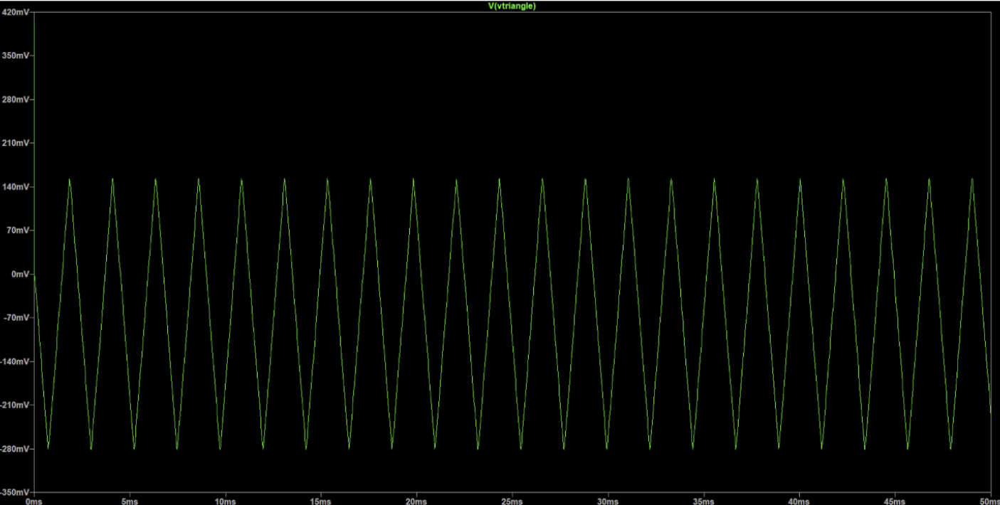
- To create the triangle wave generator, we grabbed a 1uF cap for C1 and a 10kΩ resistor for R3. We built the square wave generator as in the circuit (the square wave part is not as important—that is not the point of this prototype circuit), and then fed its output into our integrator to get a triangle wave. Below is the result, after probing the output for display on the scope.
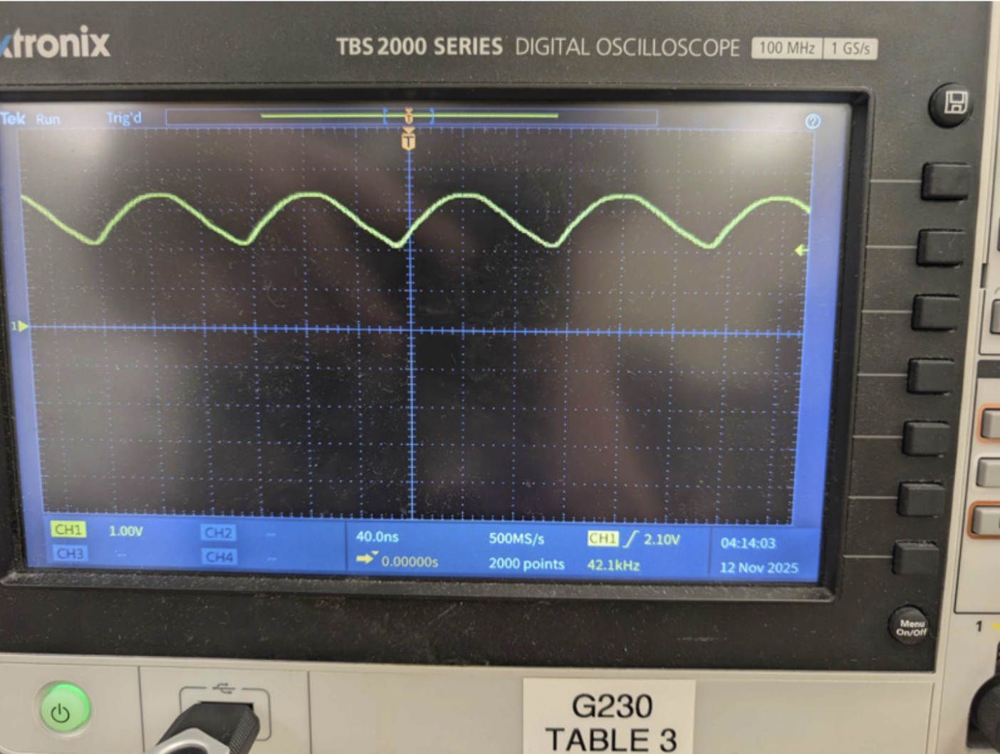
- For this first iteration, we saw an unexpected ~3V DC offset. Also, clearly the waveform is quite inaccurate, with the peaks being rounded, instead of sharp.
- We suspected that problems from our op-amp square generator may have propogated through to our triangle wave integrator. So, we disconnected the square wave generator from the integrator and made its input our in-lab waveform generator (the one that produces very accurate waveforms). We also swapped the 10kΩ resistor for a 1kΩ resistor.
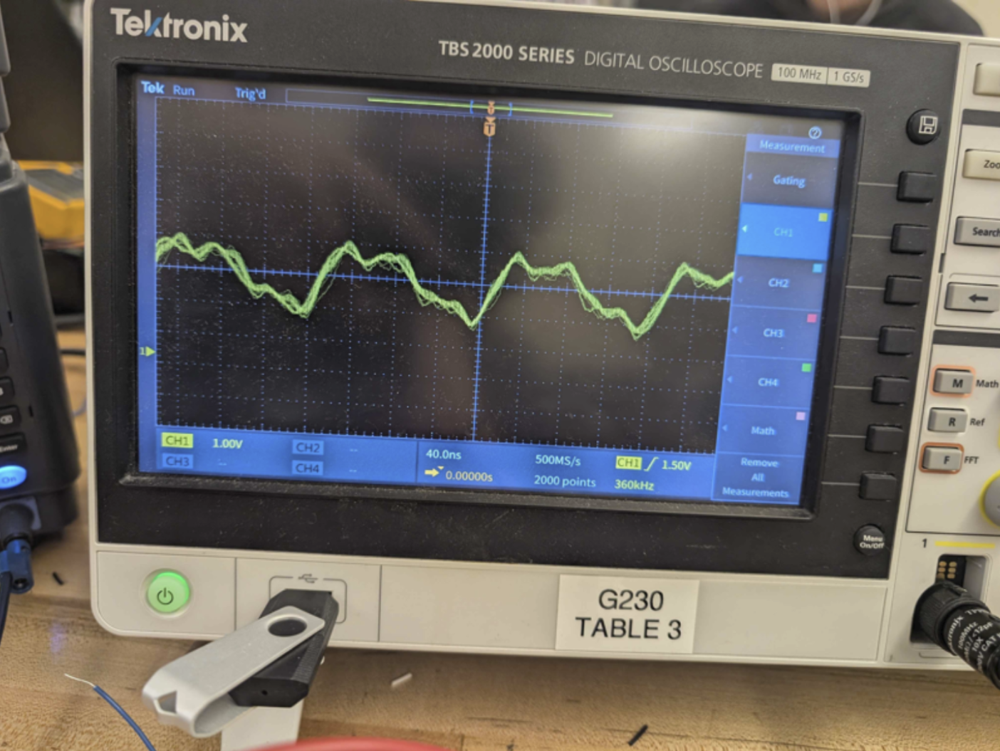
- This was not expected. However, connecting the square wave generator we made back up, while still using the new 1kΩ resistor, resulted in a much better looking waveform.
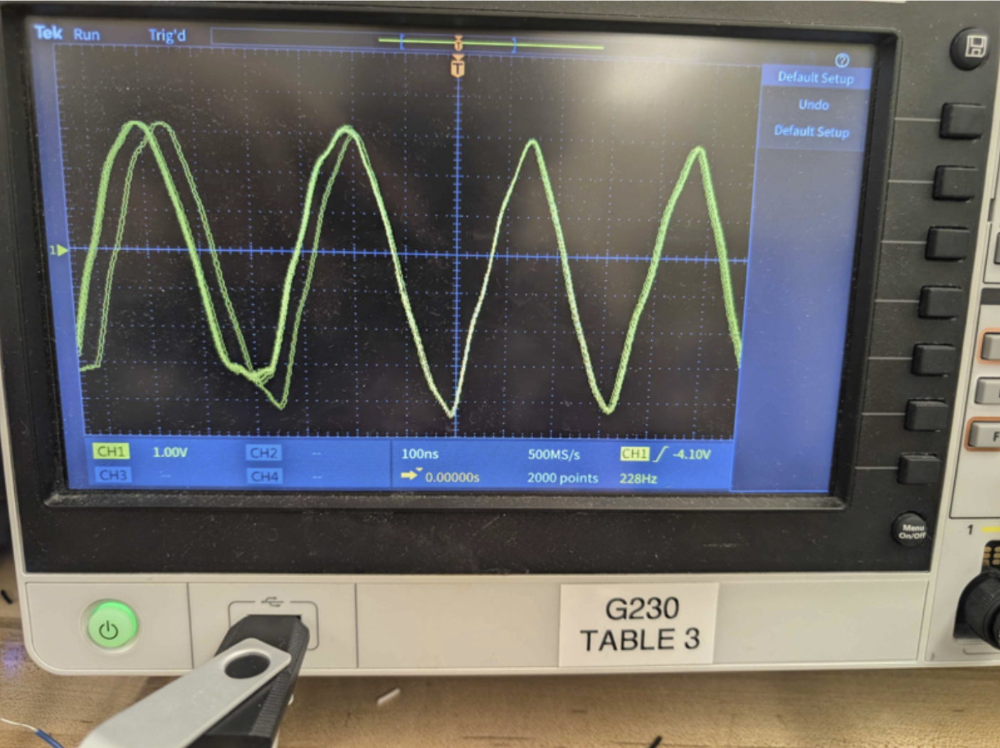
- Clearly the general shape of the waveform is better, but the minimum voltage and maximum voltage attained are different.
- We hypothesized that many of these problems, including the DC offset, were caused by the non-idealness of our components—mainly, the capacitor. Following Lab 4, we measured the "Equiv Circuit" of the capacitor, set to parallel. We got a reading of about 140kΩ, and so we grabbed a 118kΩ resistor to put in parallel with the cap.
- To test if the remaining problems were with the square generator or the integrator, we connected the integrator to the good in-lab wave generator and set it to square waves at 100Hz. We still found a significant difference in the max and min voltages. We also replaced the op-amp with the LF365 (replacing the NTE937) as it gave better results. Below is what we observed.
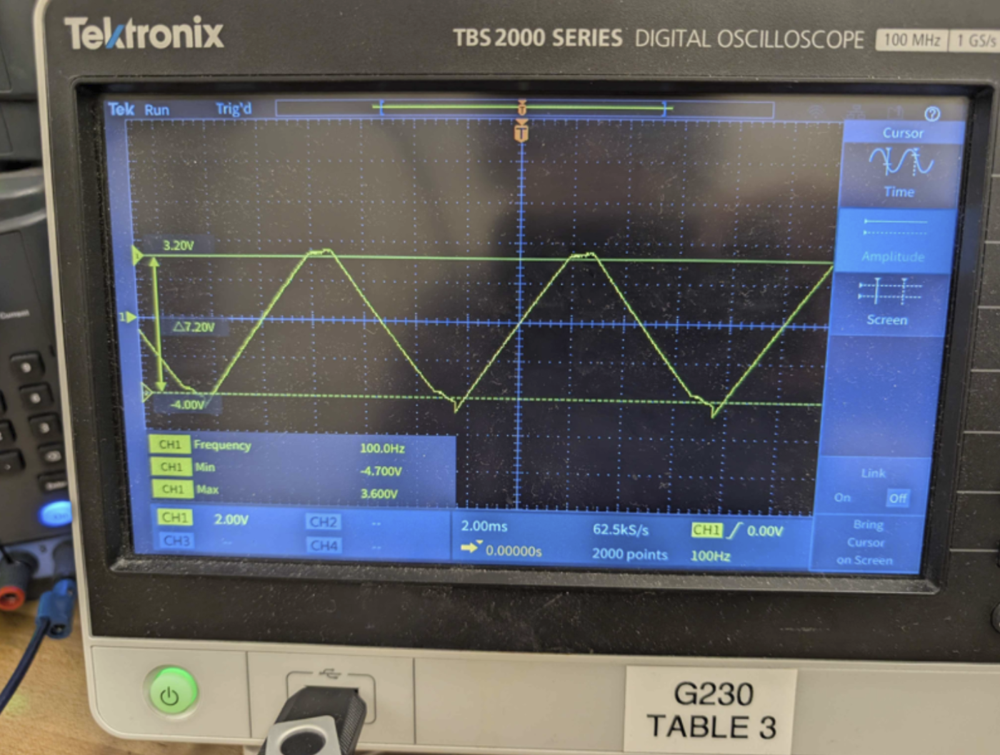
- Next we increased the amplitude voltage of the input square wave, and this evened out the min and max output voltages of the integrator. Putting in 10V, we saw a max output of 4.770 V and a min of -4.500 V. The waveform also seemed to be quite accurate using the good wave generator square wave, so we next looked to our simple square wave generator to try to find fixes/insurmountable restrictions. Below is the triangle output against our simple square wave generator.
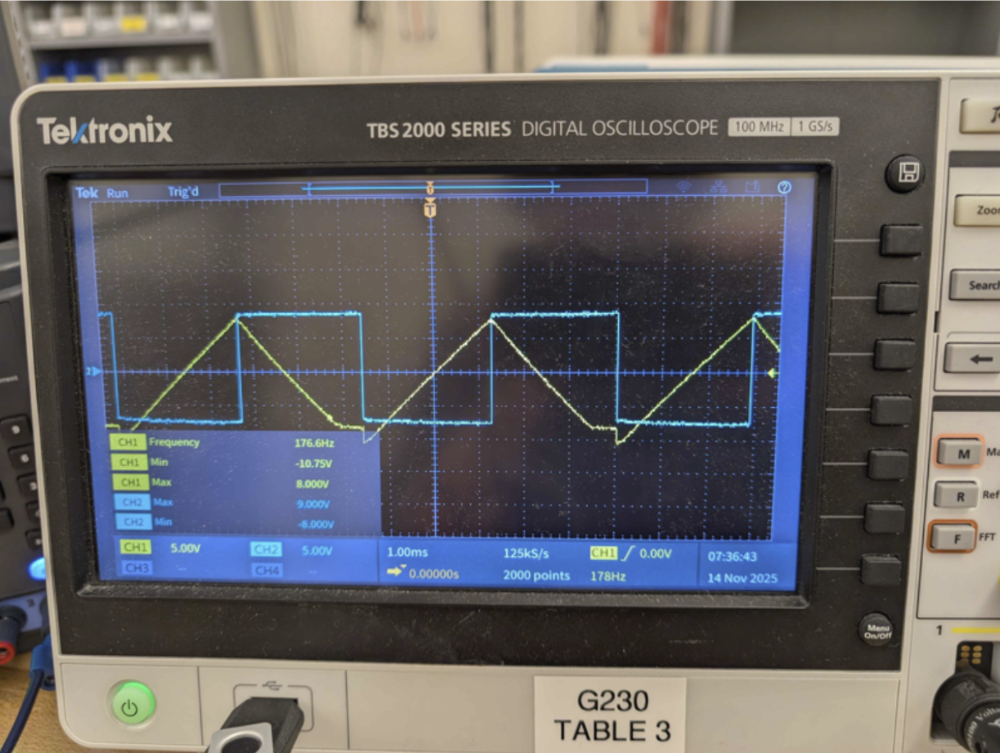
- We see that the integrator flattens at the bottom, at the same value of the square wave output (the integrator portion of the circuit also inverts the signal, so when it's bottoming out it's actually topping out, matching that max positive value of voltage from the square wave input). We increased the resistor between the square wave generator and the triangle wave portion to 5kΩ, hypothesizing that the imperfections could be caused by transient current, which the increased resistance should help with. Following this change, the clipping was fixed, and the waveform was quite accurate, with a frequency adjustable by the turn of the potentiometer in the simple square wave portion of the circuit.
#### 11/16
- After the successful triangle wave, we decided to try to create a sine wave generator. We decided to make a Wien bridge oscillator, which is a very creative oscillator: the Wien bridge portion of the circuit acts as both a low-pass filter and a high-pass filter (these are the R1, C1 and R2, C2 portions of the circuit), cutting all signals down into one resonance frequency. Then, the op-amp amplifies this resonance frequency. Below is the inital schematic we made in LTspice.
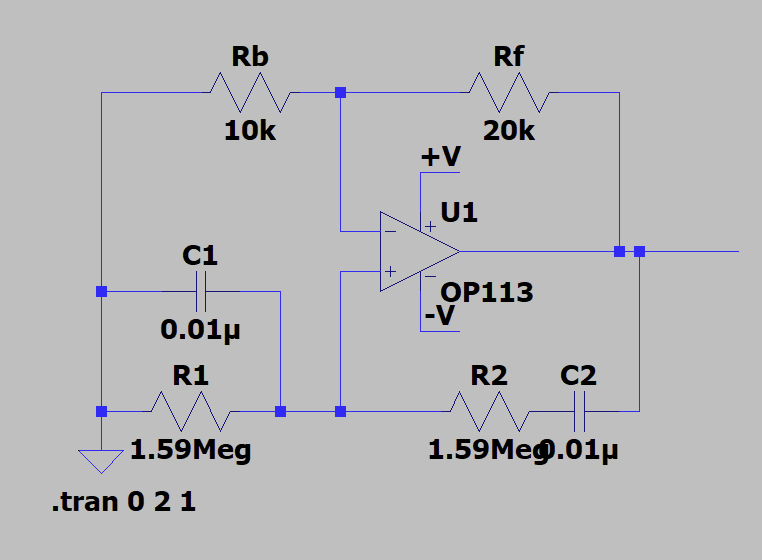
- One might notice that the Wien bridge oscillator circuit seems to have no input voltage, only an op-amp with feedback, the Wien bridge, and an output. This is because it is built to start off of random electrical noise. The electrical noise that has the desired resonance frequency is passed through the op-amp and amplified, and this feedback loop makes this signal larger and larger. In the case of this specific Wien bridge oscillator, the resonance frequency that gets amplified is $\frac1{2\pi RC}$, assuming that R1 = R2 = R and C1 = C2 = C. So, given the values in the schematic, this oscillator would result in a sine wave with a frequency of about 10 Hz. Because of the way that this oscillator relies on ambient electrical noise, this means we cannot run our schematic as a simulation in LTspice (LTspice does not take into account "imperfections" or random electrical noise).
- The closest resistors we could find in lab were 2.2MΩ. With these resistors, the frequency of the output wave should be about 7.2 Hz. We put together the oscillator according to the schematic, and used the 2.2MΩ resistors. The op-amp was supplied with $\pm$12V of supply voltage. Below was the measured output.
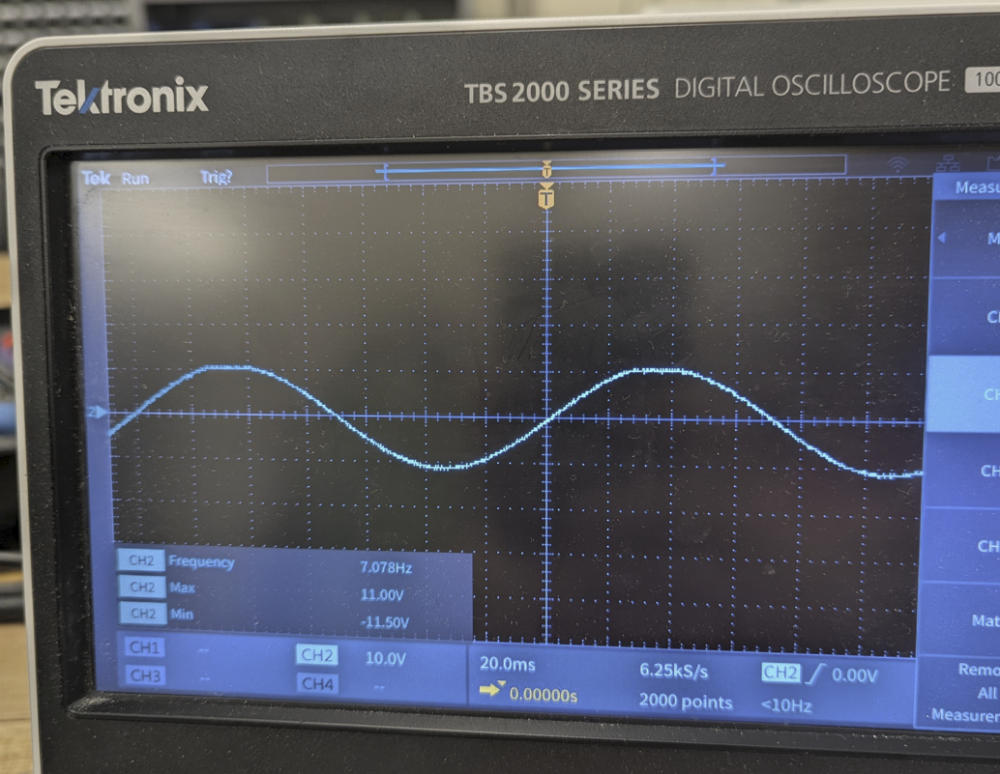
- The waveform was very good, and the frequency according to the scope was about 7.1 Hz (reasonable to say this was due to small deviation in component values). The only small oddities were the very slight clipping at the peaks of the sine wave (visually we can see it is flatter than it should be), and a small difference between the min voltage and max voltage (min: -11.50 V, max: 11.00 V). We found that changing the supply voltage (e.g. to $\pm$15V) only changed the amplitude of the output wave and did not help or hurt the small clipping of the waveform.
- To test other frequencies, we changed the two 2.2 MΩ resistors out for 220k Ω resistors. Theoretically, this should just increase the frequency of the output sine wave by a factor of 10, resulting in about 70Hz. Inititally though, we got 0V. Thinking that the gain of the op-amp wasn't enough to kickstart the positive feedback loop to get stable oscillations, we replaced the 20k Ω feedback resistor with a 20k Ω and 1k Ω in series, which would theoretically increase the gain. After making this change, we got stable oscillations at around 70 Hz, as expected. Below is the result.
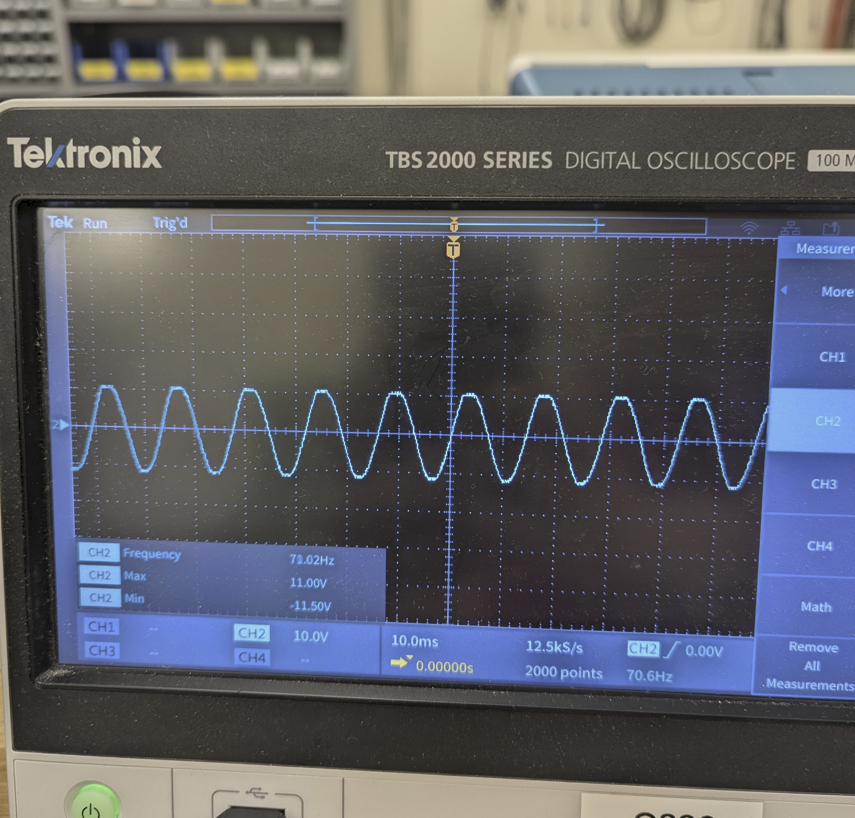
- Because the Wien bridge oscillator does not have an input voltage that drives it, the best way to change the amplitude of the output sine wave would most likely be by feeding the sine wave output as the input of a second high-gain stage, which would have some way to change its gain using a dial/knob.
- To make this circuit have a variable frequency, we would want to either change both capacitors at the same time with a knob, or change both R1 and R2 at the same time with a knob. This is not super easy, and to make this as simple as possible we would need to order a dual gang potentiometer (a pot with two resistive strips, two wipers, and one knob that controls all of it). Alternatively we could connect up both of our breadboard header's potentiometers in place of R1 and R2 and just try to change both knobs at the same time—a bit of a hassle. We will determine whether we think it is worth it to try this for week 3, or if this would be a waste of time and we should just jump straight into making circuits with the integrated circuits we ordered.